## Importing Of Necessary Libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
!ls '/content/drive/MyDrive/Classification_training_results/logs/'

fit_resnet  fit_vgg16


In [2]:
!pip install vit_keras
!pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 9.3 MB/s eta 0:00:00


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
from PIL import Image
from io import BytesIO
import shutil

from concurrent.futures import ThreadPoolExecutor

import google

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16,ResNet50, InceptionV3, MobileNetV2 , DenseNet121, Xception
from keras import layers, models
from keras.callbacks import EarlyStopping
import tensorflow_addons as tfa
from vit_keras import vit

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
import datetime

import warnings
warnings.filterwarnings("ignore")


from sklearn.utils.class_weight import compute_class_weight

# import torch
# import torch.nn as nn
# import torch.optim as optim
# from torch.utils.data import DataLoader , random_split
# from torchvision import datasets, transforms, models

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


## Reading Data And Intial Visualization Of The Image Data

In [4]:
dir = "/content/drive/MyDrive/Taro_Full_Dataset"
training_logs = "/content/drive/MyDrive/Classification_training_results"

In [5]:
# Check if the directory exists
if os.path.exists(dir):
    # Get the list of files and directories in the specified path
    contents = os.listdir(dir)

    # Print the list of contents
    print("Contents of the directory:")
    for item in contents:
        print(item)
else:
    print(f"The directory '{dir}' does not exist.")

Contents of the directory:
Taro_Mid_Blight
Taro_Healthy
source_ghana_Taro_Mid_Blight.txt
ghana_Taro_Mid_Blight.txt
Taro_Early_Blight
source_ghana_Taro_Healthy.txt
ghana_Taro_Healthy.txt
Taro_Late_Blight
source_ghana_Taro_Early_Blight.txt
ghana_Taro_Early_Blight.txt
source_ghana_Taro_Late_Blight.txt
ghana_Taro_Late_Blight.txt
ebonyi_Taro_Mid_Blight.txt
source_ebonyi_Taro_Mid_Blight.txt
ebonyi_Taro_Early_Blight.txt
source_ebonyi_Taro_Early_Blight.txt
ebonyi_Taro_Healthy.txt
source_ebonyi_Taro_Healthy.txt
ebonyi_Taro_Late_Blight.txt
source_ebonyi_Taro_Late_Blight.txt
enugu_Taro_Healthy.txt
source_enugu_Taro_Healthy.txt
enugu_Taro_Early_Blight.txt
source_enugu_Taro_Early_Blight.txt
enugu_Taro_Mid_Blight.txt
source_enugu_Taro_Mid_Blight.txt
enugu_Taro_Late_Blight.txt
source_enugu_Taro_Late_Blight.txt
source_oby_Taro_Early_Blight.txt
oby_Taro_Early_Blight.txt
source_oby_Taro_Healthy.txt
source_oby_Taro_Late_Blight.txt
oby_Taro_Healthy.txt
oby_Taro_Late_Blight.txt
source_oby_Taro_Mid_Blight.t

## Data (Image) Processing : Tensorflow 🎾

In [6]:
# Get the list of subfolders (classes)
subfolders = [folder for folder in os.listdir(dir) if os.path.isdir(os.path.join(dir, folder))]

# Folders to avoid
avoid_folders = ["Taro Leave Blight Images", "Taro_Late_Blight", "Taro_Mid_Blight", "zips"]

# Filter out the folders to avoid
subfolders = [folder for folder in subfolders if folder not in avoid_folders]

# Count the number of files in each subfolder
for subfolder in subfolders:
    subfolder_path = os.path.join(dir, subfolder)
    file_count = len(os.listdir(subfolder_path))
    print(f"Subfolder: {subfolder}, Number of files: {file_count}")

Subfolder: Taro_Healthy, Number of files: 3639
Subfolder: Taro_Early_Blight, Number of files: 3476
Subfolder: Taro_Not_Early, Number of files: 2972


### RGB Image Processing 🌈

In [9]:
def check_images(image_folder):
    for filename in os.listdir(image_folder):
        full_path = os.path.join(image_folder, filename)
        try:
            with open(full_path, 'rb') as f:
                img = Image.open(BytesIO(f.read()))
            # Perform any additional processing if needed
        except Exception as e:
            print(f"Error opening {full_path}: {e}")

In [10]:
def process_image_to_rgb(img_path, output_base_dir):
    with Image.open(img_path) as img:
        # Convert to RGB
        img_rgb = img.convert('RGB')

        # Get the relative path of the image within the main directory
        relative_path = os.path.relpath(img_path, dir)

        # Create the output directory for the image in the output base directory
        output_path = os.path.join(output_base_dir, "processed_images", relative_path)
        os.makedirs(os.path.dirname(output_path), exist_ok=True)

        # Save the processed image in the output directory
        img_rgb.save(output_path)

def process_images_to_rgb_parallel(main_dir, output_base_dir, avoid_folders=None, max_workers=None):
    subfolders = [folder for folder in os.listdir(main_dir) if os.path.isdir(os.path.join(main_dir, folder))]
    avoid_folders = avoid_folders or []
    subfolders = [folder for folder in subfolders if folder not in avoid_folders]

    # Create the output directory if it doesn't exist
    output_dir = os.path.join(output_base_dir, "processed_images")
    os.makedirs(output_dir, exist_ok=True)

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        for subfolder in subfolders:
            subfolder_path = os.path.join(main_dir, subfolder)
            img_paths = [os.path.join(subfolder_path, filename) for filename in os.listdir(subfolder_path)]

            # Process and save images in parallel
            executor.map(process_image_to_rgb, img_paths, [output_base_dir] * len(img_paths))

    for subfolder in subfolders:
        subfolder_output_dir = os.path.join(output_dir, subfolder)
        file_count = len(os.listdir(subfolder_output_dir))
        print(f"Subfolder: {subfolder}, Number of processed files: {file_count}")

In [11]:
output_base_directory = "/content/RGB"

avoid_folders = ["Taro Leave Blight Images", "Taro_Late_Blight", "Taro_Mid_Blight", "zips"]
max_workers = 8

process_images_to_rgb_parallel(dir, output_base_directory, avoid_folders=avoid_folders, max_workers=max_workers)

Subfolder: Taro_Healthy, Number of processed files: 3639
Subfolder: Taro_Early_Blight, Number of processed files: 3476
Subfolder: Taro_Not_Early, Number of processed files: 2341


In [21]:
output_dir = "/content/RGB/processed_images"
os.listdir(output_dir)

['Taro_Not_Early', 'Taro_Healthy', 'Taro_Early_Blight']

## Copy


In [11]:
import shutil
import os

def copy_files(source_folder, destination_folder):
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    for filename in os.listdir(source_folder):
        source_file = os.path.join(source_folder, filename)
        destination_file = os.path.join(destination_folder, filename)
        print(destination_file)
        shutil.copyfile(source_file, destination_file)

In [ ]:
dir = "/content/drive/MyDrive/Taro_Full_Dataset"
destination = "/content/images"
subfolders = ["Taro_Early_Blight", "Taro_Healthy", "Taro_Not_Early"]
for subfolder in subfolders:
  subfolder_path = os.path.join(dir, subfolder)
  destination_path = os.path.join(destination, subfolder)
  copy_files(subfolder_path, destination_path)

In [13]:
output_dir = "/content/images"
os.listdir(output_dir)

['Taro_Early_Blight', 'Taro_Not_Early', 'Taro_Healthy']

## Data Normalization And Splitting :Tensorflow ⏰

In [7]:
output_dir = "/content/drive/MyDrive/Taro_Full_Dataset"
os.listdir(output_dir)

['Taro_Mid_Blight',
 'Taro_Healthy',
 'source_ghana_Taro_Mid_Blight.txt',
 'ghana_Taro_Mid_Blight.txt',
 'Taro_Early_Blight',
 'source_ghana_Taro_Healthy.txt',
 'ghana_Taro_Healthy.txt',
 'Taro_Late_Blight',
 'source_ghana_Taro_Early_Blight.txt',
 'ghana_Taro_Early_Blight.txt',
 'source_ghana_Taro_Late_Blight.txt',
 'ghana_Taro_Late_Blight.txt',
 'ebonyi_Taro_Mid_Blight.txt',
 'source_ebonyi_Taro_Mid_Blight.txt',
 'ebonyi_Taro_Early_Blight.txt',
 'source_ebonyi_Taro_Early_Blight.txt',
 'ebonyi_Taro_Healthy.txt',
 'source_ebonyi_Taro_Healthy.txt',
 'ebonyi_Taro_Late_Blight.txt',
 'source_ebonyi_Taro_Late_Blight.txt',
 'enugu_Taro_Healthy.txt',
 'source_enugu_Taro_Healthy.txt',
 'enugu_Taro_Early_Blight.txt',
 'source_enugu_Taro_Early_Blight.txt',
 'enugu_Taro_Mid_Blight.txt',
 'source_enugu_Taro_Mid_Blight.txt',
 'enugu_Taro_Late_Blight.txt',
 'source_enugu_Taro_Late_Blight.txt',
 'source_oby_Taro_Early_Blight.txt',
 'oby_Taro_Early_Blight.txt',
 'source_oby_Taro_Healthy.txt',
 'source_

In [14]:
datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

# Set the target size for VGG16 (224x224 pixels)
target_size = (224, 224)

# Set batch size
batch_size = 32

# Create a generator for both training and validation
generator = datagen.flow_from_directory(
    output_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=subfolders
)

validation_generator = datagen.flow_from_directory(
    output_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=subfolders,
    shuffle = False
)

Found 8071 images belonging to 3 classes.
Found 2016 images belonging to 3 classes.


In [15]:
train_class_labels = list(generator.class_indices.keys())

# Get the class labels from the validation generator
validation_class_labels = list(validation_generator.class_indices.keys())

print("Class labels for training:", train_class_labels)
print("Class labels for validation:", validation_class_labels)

Class labels for training: ['Taro_Early_Blight', 'Taro_Healthy', 'Taro_Not_Early']
Class labels for validation: ['Taro_Early_Blight', 'Taro_Healthy', 'Taro_Not_Early']


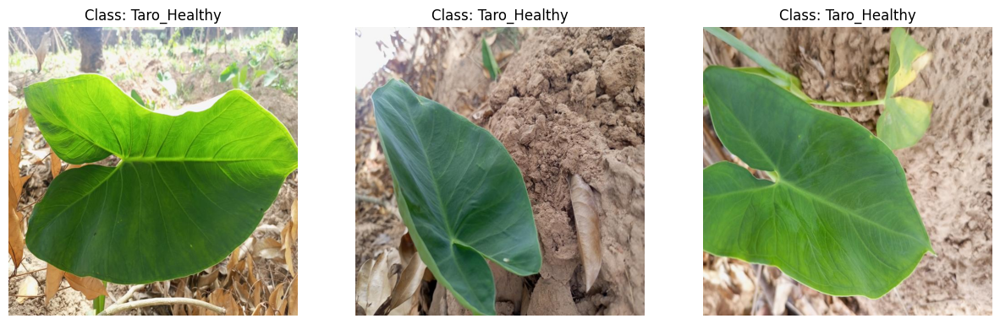

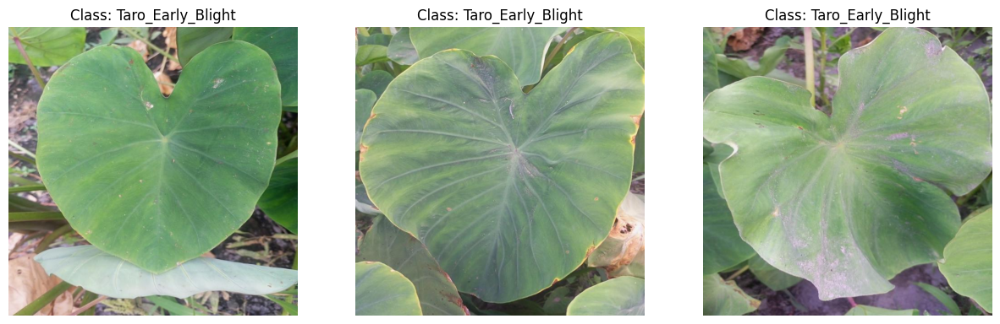

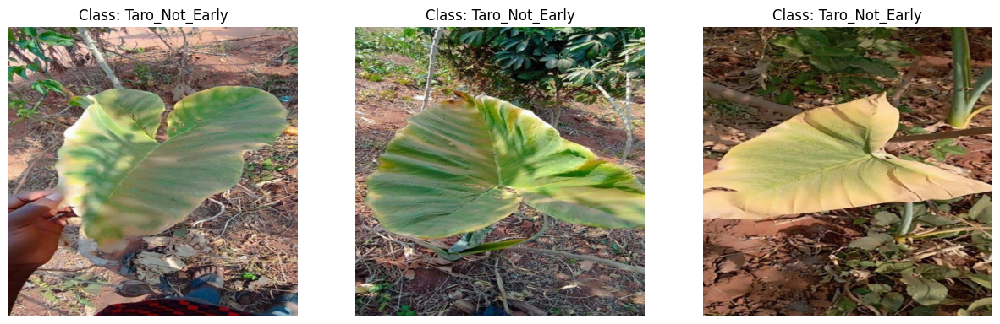

In [26]:
# Get a few images from each class
num_images_per_class ,  num_columns = 3 , 3

num_rows = len(subfolders) // num_columns + (1 if len(subfolders) % num_columns > 0 else 0)

# Loop through each class
for class_index, class_name in enumerate(subfolders):
    class_path = os.path.join(dir, class_name)

    # Get the list of images in the class folder
    images_list = os.listdir(class_path)

    # Display a few images from the class
    plt.figure(figsize=(15, 5))

    for i in range(min(num_images_per_class, len(images_list))):
        # Select the i-th image from the class
        image_name = images_list[i]

        # Load and display the image
        image_path = os.path.join(class_path, image_name)
        image = plt.imread(image_path)

        # Plot the image in the appropriate subplot
        plt.subplot(num_rows, num_columns, i + 1)
        plt.imshow(image)
        plt.title(f"Class: {class_name}")
        plt.axis("off")

    plt.show()

### Classification Report : Function

In [16]:
def classification_reporter(y_true, y_pred_classes, target_names):
  # Generate a classification report
  print(classification_report(y_true, y_pred_classes, target_names = class_names))

In [75]:
def plot_history(history, title):
    # Plot accuracy
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history['accuracy'], label='Training Accuracy')
    plt.plot(history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label='Training Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{title} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

def combined_plot_history(histories, titles):
    num_models = len(histories)
    num_metrics = 4

    plt.figure(figsize=(12, 12))

    # Plot Training Accuracy
    plt.subplot(4, 1, 1)
    for j in range(num_models):
        plt.plot(histories[j]['accuracy'], label=f'{titles[j]}')
    plt.ylabel('Accuracy')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot Validation Accuracy
    plt.subplot(4, 1, 2)
    for j in range(num_models):
        plt.plot(histories[j]['val_accuracy'], label=f'{titles[j]}')
    plt.ylabel('Accuracy')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot Training Loss
    plt.subplot(4, 1, 3)
    for j in range(num_models):
        plt.plot(histories[j]['loss'], label=f'{titles[j]}')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot Validation Loss
    plt.subplot(4, 1, 4)
    for j in range(num_models):
        plt.plot(histories[j]['val_loss'], label=f'{titles[j]}')
    plt.ylabel('Loss')
    plt.title('Validation Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [18]:
def plot_confusion_matrix(y_true, y_pred_classes, class_names, model_name):
    cm = confusion_matrix(y_true, y_pred_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix for {model_name} Model')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

In [19]:
import numpy as np

def save_history(history, filename):
  np.save(filename, history.history)

def load_history(filename):
  history=np.load(filename, allow_pickle='TRUE').item()
  return history

In [20]:
print(len(generator.class_indices.keys()))

3


## Model Intialization

In [21]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation = 'relu'),
    layers.Dropout(0.5),
    layers.Dense(len(train_class_labels), activation='softmax')
])

58889256/58889256 [==============================] - 0s 0us/step


## Model Bulilding : VGG16

In [22]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 3)                 3

### Model Evaluation : VGG16

In [23]:
epochs = 50
batch_size = 32

In [24]:
# Define TensorBoard callback
log_dir = training_logs + "/logs/fit_vgg16/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define ModelCheckpoint callback to save model weights
checkpoint_path = log_dir + "/model_checkpoint_vgg16.h5"
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=True)

# Calculate class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(generator.classes), y=generator.classes)

# Convert class weights to a dictionary
class_weight_dict = dict(zip(np.unique(generator.classes), class_weights))

history = model.fit_generator(
    generator,
    steps_per_epoch=generator.samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    class_weight=class_weight_dict,
    callbacks=[tensorboard_callback, early_stopping, model_checkpoint]
)


Epoch 1/50
252/252 [==============================] - 126s 467ms/step - loss: 1.2461 - accuracy: 0.4091 - val_loss: 1.0523 - val_accuracy: 0.4350
Epoch 2/50
252/252 [==============================] - 124s 494ms/step - loss: 1.0307 - accuracy: 0.4325 - val_loss: 1.0190 - val_accuracy: 0.4544
Epoch 3/50
252/252 [==============================] - 124s 493ms/step - loss: 1.0179 - accuracy: 0.4453 - val_loss: 0.9578 - val_accuracy: 0.5422
Epoch 4/50
252/252 [==============================] - 125s 494ms/step - loss: 1.0074 - accuracy: 0.4547 - val_loss: 0.9498 - val_accuracy: 0.5536
Epoch 5/50
252/252 [==============================] - 123s 486ms/step - loss: 0.9834 - accuracy: 0.4727 - val_loss: 1.0144 - val_accuracy: 0.4563
Epoch 6/50
252/252 [==============================] - 123s 486ms/step - loss: 0.9821 - accuracy: 0.4752 - val_loss: 0.9884 - val_accuracy: 0.4960
Epoch 7/50
252/252 [==============================] - 123s 486ms/step - loss: 0.9740 - accuracy: 0.4825 - val_loss: 0.9812 -

###Model Evaluation : Graphs Functions

### Model Evaluation : Graph Display 📊 And Classification Report ⏏

In [25]:
y_pred_vgg = model.predict(validation_generator)
y_pred_classes_vgg = np.argmax(y_pred_vgg , axis=1)
y_true_vgg = validation_generator.classes
class_names = list(validation_generator.class_indices.keys())

63/63 [==============================] - 25s 388ms/step


In [26]:
save_history(history, log_dir + "/history_vgg16.npy")

In [27]:
history_vgg16 = load_history(log_dir + "/history_vgg16.npy")
print(history_vgg16)

{'loss': [1.2461341619491577, 1.0307472944259644, 1.0178639888763428, 1.0073721408843994, 0.9833577275276184, 0.9820994734764099, 0.9739624261856079, 0.9716926217079163, 0.96403968334198], 'accuracy': [0.4091304838657379, 0.432516485452652, 0.4453290104866028, 0.45465853810310364, 0.47269561886787415, 0.47518348693847656, 0.4825226962566376, 0.4856325387954712, 0.4921010136604309], 'val_loss': [1.0522780418395996, 1.0189975500106812, 0.9577754735946655, 0.9497870802879333, 1.0144190788269043, 0.9883546233177185, 0.9811568260192871, 0.9712942242622375, 0.9585714340209961], 'val_accuracy': [0.435019850730896, 0.454365074634552, 0.5421627163887024, 0.5535714030265808, 0.4563491940498352, 0.4960317313671112, 0.4925595223903656, 0.5054563283920288, 0.5069444179534912]}


In [28]:
classification_reporter(y_true_vgg, y_pred_classes_vgg, class_names)

                   precision    recall  f1-score   support

Taro_Early_Blight       0.50      0.20      0.28       695
     Taro_Healthy       0.59      0.78      0.67       727
   Taro_Not_Early       0.54      0.71      0.62       594

         accuracy                           0.56      2016
        macro avg       0.54      0.56      0.52      2016
     weighted avg       0.54      0.56      0.52      2016



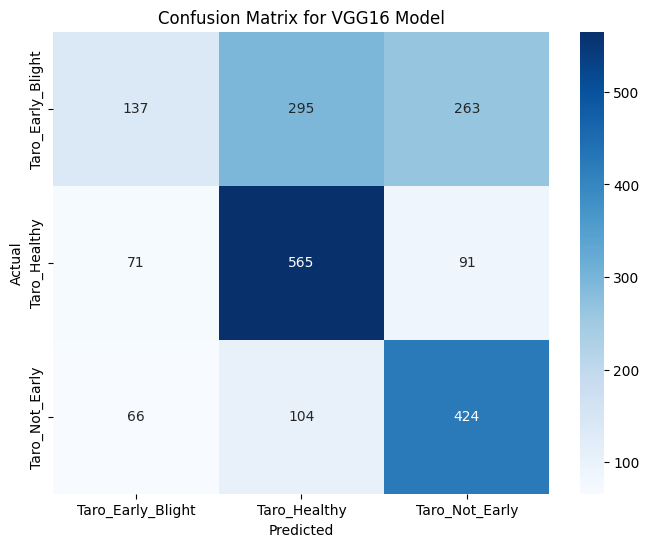

In [29]:
plot_confusion_matrix(y_true_vgg, y_pred_classes_vgg, class_names, "VGG16")

## Model Build : RestNet50

In [30]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model_resnet = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(train_class_labels), activation='softmax')
])


model_resnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_resnet.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_3 (Dense)             (None, 256)               524544    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 128)               32896     
                                                                 
 dropout_3 (Dropout)         (None, 128)               

### Model Fitting  : ResNet50

In [31]:
# Define TensorBoard callback
log_dir_resnet = training_logs + "/logs/fit_resnet/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback_resnet = TensorBoard(log_dir=log_dir_resnet, histogram_freq=1)

# Define EarlyStopping callback for the second model
early_stopping_resnet = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define ModelCheckpoint callback to save model weights for the second model
checkpoint_path_resnet = log_dir_resnet + "/model_checkpoint_resnet.h5"
model_checkpoint_resnet = ModelCheckpoint(filepath=checkpoint_path_resnet, save_best_only=True)

# Fit the second model with early stopping and callbacks
history_resnet = model_resnet.fit(
    generator,
    epochs=50,  # Adjust the number of epochs as needed
    validation_data=validation_generator,
    callbacks=[tensorboard_callback_resnet, early_stopping_resnet, model_checkpoint_resnet]
)


Epoch 1/50
253/253 [==============================] - 131s 499ms/step - loss: 1.1202 - accuracy: 0.3435 - val_loss: 1.0968 - val_accuracy: 0.2227
Epoch 2/50
253/253 [==============================] - 125s 495ms/step - loss: 1.0958 - accuracy: 0.3609 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 3/50
253/253 [==============================] - 124s 491ms/step - loss: 1.0952 - accuracy: 0.3614 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 4/50
253/253 [==============================] - 124s 490ms/step - loss: 1.0951 - accuracy: 0.3613 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 5/50
253/253 [==============================] - 126s 500ms/step - loss: 1.0951 - accuracy: 0.3603 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 6/50
253/253 [==============================] - 127s 500ms/step - loss: 1.0954 - accuracy: 0.3608 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 7/50
253/253 [==============================] - 127s 501ms/step - loss: 1.0951 - accuracy: 0.3612 - val_loss: 1.0950 -

In [32]:
save_history(history_resnet, log_dir_resnet + "/history_resnet.npy")

In [33]:
history_resnet = load_history(log_dir_resnet + "/history_resnet.npy")
print(history_resnet)

{'loss': [1.1201845407485962, 1.0957680940628052, 1.0952469110488892, 1.095107913017273, 1.095071792602539, 1.095362663269043, 1.0951457023620605, 1.095133900642395, 1.0954662561416626, 1.0952222347259521, 1.0952333211898804, 1.095126748085022, 1.0953289270401, 1.095067024230957], 'accuracy': [0.3434518575668335, 0.36092182993888855, 0.36141741275787354, 0.3612935245037079, 0.3603023290634155, 0.3607979118824005, 0.36116960644721985, 0.36092182993888855, 0.3607979118824005, 0.3605501055717468, 0.36067402362823486, 0.3607979118824005, 0.3610457181930542, 0.3607979118824005], 'val_loss': [1.0968139171600342, 1.0950305461883545, 1.0950309038162231, 1.0950442552566528, 1.0950186252593994, 1.09501314163208, 1.0950076580047607, 1.0950082540512085, 1.0949945449829102, 1.0950062274932861, 1.0950077772140503, 1.0950011014938354, 1.0950133800506592, 1.0949993133544922], 'val_accuracy': [0.2227182537317276, 0.360615074634552, 0.360615074634552, 0.360615074634552, 0.360615074634552, 0.360615074634

## Model Evaluation : ResNet50

In [34]:
y_pred_resnet = model_resnet.predict(validation_generator)
y_pred_classes_resnet = np.argmax(y_pred_resnet , axis=1)
y_true_resnet = validation_generator.classes

classification_reporter(y_true_resnet, y_pred_classes_resnet, class_names)

63/63 [==============================] - 25s 389ms/step
                   precision    recall  f1-score   support

Taro_Early_Blight       0.00      0.00      0.00       695
     Taro_Healthy       0.36      1.00      0.53       727
   Taro_Not_Early       0.00      0.00      0.00       594

         accuracy                           0.36      2016
        macro avg       0.12      0.33      0.18      2016
     weighted avg       0.13      0.36      0.19      2016



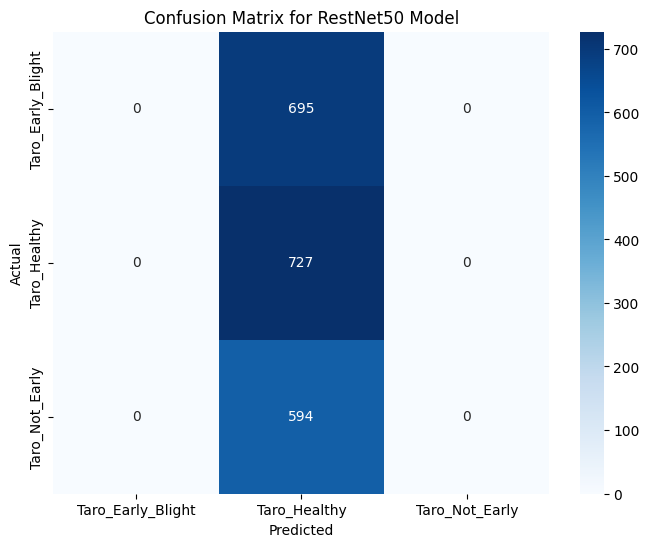

In [35]:
plot_confusion_matrix(y_true_resnet, y_pred_classes_resnet, class_names, "RestNet50")

## Vision Transformer : ViT

In [36]:
vit_model = vit.vit_b16(
        image_size = (224, 224),
        activation = 'softmax',
        pretrained = True,
        include_top = False,
        pretrained_top = False,
        classes = 3)

347502902/347502902 [==============================] - 1s 0us/step


In [37]:
model_vit = keras.Sequential([
        vit_model,
        keras.layers.Flatten(),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(128, activation = tfa.activations.gelu),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(64, activation = tfa.activations.gelu),
        keras.layers.Dense(32, activation = tfa.activations.gelu),
        keras.layers.Dense(3, 'softmax')
    ],
    name = 'vision_transformer')

model_vit.summary()

Model: "vision_transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vit-b16 (Functional)        (None, 768)               85798656  
                                                                 
 flatten_1 (Flatten)         (None, 768)               0         
                                                                 
 batch_normalization (Batch  (None, 768)               3072      
 Normalization)                                                  
                                                                 
 dense_6 (Dense)             (None, 128)               98432     
                                                                 
 batch_normalization_1 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dense_7 (Dense)             (None, 64)         

In [38]:
learning_rate = 1e-4
optimizer = tfa.optimizers.RectifiedAdam(learning_rate = learning_rate)
model_vit.compile(optimizer = optimizer,
              loss = keras.losses.CategoricalCrossentropy(label_smoothing = 0.2),
              metrics = ['accuracy'])

STEP_SIZE_TRAIN = generator.n // generator.batch_size
STEP_SIZE_VALID = validation_generator.n // validation_generator.batch_size

In [39]:
# Define TensorBoard callback
log_dir_vit = training_logs + "/logs/fit_vit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback_vit = TensorBoard(log_dir=log_dir_vit, histogram_freq=1)

# Define EarlyStopping callback
early_stopping_vit = EarlyStopping(
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Define ModelCheckpoint callback
checkpoint_path_vit = log_dir_vit + "/model_checkpoint_vit.h5"
model_checkpoint_vit = ModelCheckpoint(filepath=checkpoint_path_vit, save_best_only=True)

# Fit the VIT model with early stopping, TensorBoard logging, and model checkpoint saving
history_vit = model_vit.fit(
    x=generator,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=validation_generator,
    validation_steps=STEP_SIZE_VALID,
    epochs=50,
    callbacks=[early_stopping_vit, tensorboard_callback_vit, model_checkpoint_vit]
)


Epoch 1/50
252/252 [==============================] - 247s 870ms/step - loss: 1.0812 - accuracy: 0.5142 - val_loss: 0.9569 - val_accuracy: 0.5952
Epoch 2/50
252/252 [==============================] - 226s 898ms/step - loss: 0.8420 - accuracy: 0.7197 - val_loss: 0.9520 - val_accuracy: 0.6572
Epoch 3/50
252/252 [==============================] - 228s 903ms/step - loss: 0.7876 - accuracy: 0.7680 - val_loss: 0.9331 - val_accuracy: 0.6706
Epoch 4/50
252/252 [==============================] - 214s 850ms/step - loss: 0.7636 - accuracy: 0.7898 - val_loss: 1.0548 - val_accuracy: 0.6235
Epoch 5/50
252/252 [==============================] - 215s 853ms/step - loss: 0.7260 - accuracy: 0.8194 - val_loss: 0.9836 - val_accuracy: 0.6657
Epoch 6/50
252/252 [==============================] - 215s 851ms/step - loss: 0.7057 - accuracy: 0.8346 - val_loss: 0.9493 - val_accuracy: 0.7004
Epoch 7/50
252/252 [==============================] - 214s 850ms/step - loss: 0.6806 - accuracy: 0.8556 - val_loss: 1.0091 -

In [40]:
save_history(history_vit, log_dir_vit + "/history_vit.npy")

In [41]:
history_vit = load_history(log_dir_vit + "/history_vit.npy")

In [42]:
y_pred_vit = model_vit.predict(validation_generator)
y_pred_classes_vit = np.argmax(y_pred_vit , axis=1)
y_true_vit = validation_generator.classes

classification_reporter(y_true_vit, y_pred_classes_vit, class_names)

63/63 [==============================] - 28s 399ms/step
                   precision    recall  f1-score   support

Taro_Early_Blight       0.67      0.59      0.63       695
     Taro_Healthy       0.77      0.84      0.80       727
   Taro_Not_Early       0.78      0.79      0.79       594

         accuracy                           0.74      2016
        macro avg       0.74      0.74      0.74      2016
     weighted avg       0.74      0.74      0.74      2016



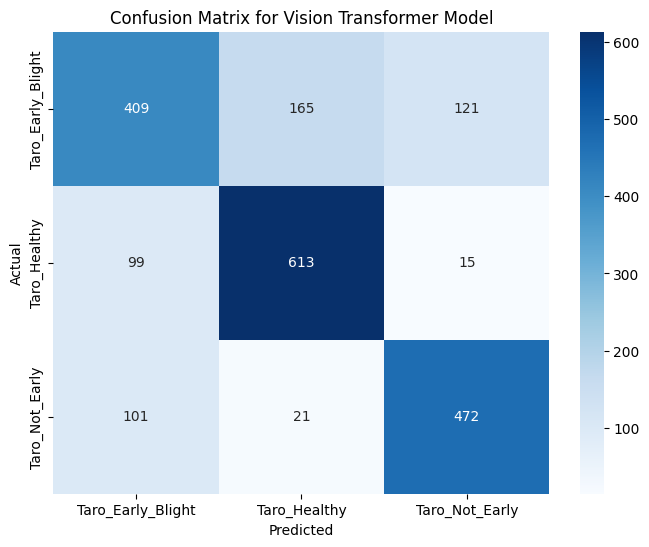

In [43]:
plot_confusion_matrix(y_true_vit, y_pred_classes_vit, class_names, "Vision Transformer")

##Inception V3

In [44]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model_IV3 = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(train_class_labels), activation='softmax')
])

87910968/87910968 [==============================] - 1s 0us/step


In [45]:
model_IV3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_IV3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_2 (Flatten)         (None, 51200)             0         
                                                                 
 dense_10 (Dense)            (None, 256)               13107456  
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dropout_5 (Dropout)         (None, 128)               0         
                                                                 
 dense_12 (Dense)            (None, 3)                

In [46]:
# Define TensorBoard callback
log_dir_iv3 = training_logs + "/logs/fit_iv3/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback_iv3 = TensorBoard(log_dir=log_dir_iv3, histogram_freq=1)

# Define EarlyStopping callback
early_stopping_iv3 = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define ModelCheckpoint callback
checkpoint_path_iv3 = log_dir_iv3 + "/model_checkpoint_iv3.h5"
model_checkpoint_iv3 = ModelCheckpoint(filepath=checkpoint_path_iv3, save_best_only=True)

# Fit the IV3 model with early stopping, TensorBoard logging, and model checkpoint saving
history_iv3 = model_IV3.fit(
    generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=[early_stopping_iv3, tensorboard_callback_iv3, model_checkpoint_iv3]
)


Epoch 1/50
253/253 [==============================] - 135s 505ms/step - loss: 2.0585 - accuracy: 0.3873 - val_loss: 1.0150 - val_accuracy: 0.4668
Epoch 2/50
253/253 [==============================] - 125s 495ms/step - loss: 1.0754 - accuracy: 0.3892 - val_loss: 1.0961 - val_accuracy: 0.3447
Epoch 3/50
253/253 [==============================] - 125s 495ms/step - loss: 1.0967 - accuracy: 0.3473 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 4/50
253/253 [==============================] - 125s 495ms/step - loss: 1.0992 - accuracy: 0.3575 - val_loss: 1.0948 - val_accuracy: 0.3611
Epoch 5/50
253/253 [==============================] - 124s 492ms/step - loss: 1.0980 - accuracy: 0.3610 - val_loss: 1.0950 - val_accuracy: 0.3606
Epoch 6/50
253/253 [==============================] - 124s 491ms/step - loss: 1.0953 - accuracy: 0.3607 - val_loss: 1.0950 - val_accuracy: 0.3606


In [47]:
save_history(history_iv3, log_dir_iv3 + "/history_iv3.npy")

In [48]:
history_iv3 = load_history(log_dir_iv3 + "/history_iv3.npy")

In [49]:
y_pred_IV3 = model_IV3.predict(validation_generator)
y_pred_classes_IV3 = np.argmax(y_pred_IV3 , axis=1)
y_true_IV3 = validation_generator.classes

classification_reporter(y_true_IV3, y_pred_classes_IV3, class_names)

63/63 [==============================] - 26s 396ms/step
                   precision    recall  f1-score   support

Taro_Early_Blight       0.38      0.80      0.52       695
     Taro_Healthy       0.68      0.51      0.58       727
   Taro_Not_Early       0.00      0.00      0.00       594

         accuracy                           0.46      2016
        macro avg       0.35      0.44      0.37      2016
     weighted avg       0.38      0.46      0.39      2016



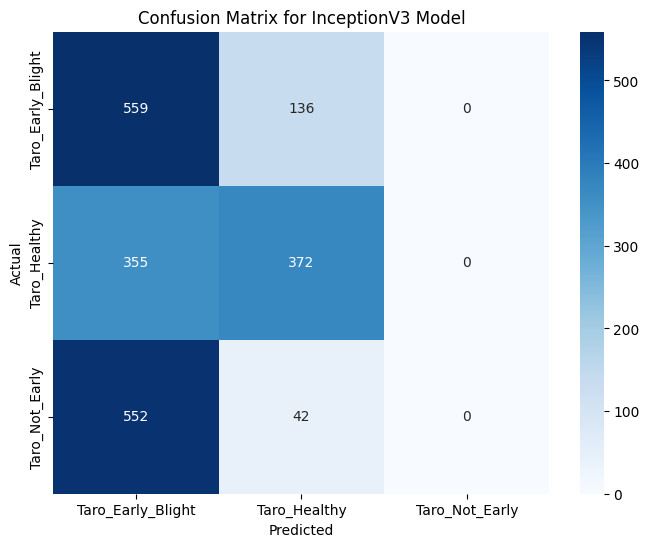

In [58]:
plot_confusion_matrix(y_true_IV3, y_pred_classes_IV3, class_names, "InceptionV3")

## MobileNetV2

In [51]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model_MV2 = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(train_class_labels), activation='softmax')
])

9406464/9406464 [==============================] - 0s 0us/step


In [52]:
model_MV2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_MV2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 flatten_3 (Flatten)         (None, 62720)             0         
                                                                 
 dense_13 (Dense)            (None, 256)               16056576  
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_14 (Dense)            (None, 128)               32896     
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                      

In [53]:
# Define TensorBoard callback
log_dir_mv2 = training_logs + "/logs/fit_mv2/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback_mv2 = TensorBoard(log_dir=log_dir_mv2, histogram_freq=1)

# Define EarlyStopping callback
early_stopping_mv2 = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define ModelCheckpoint callback
checkpoint_path_mv2 = log_dir_mv2 + "/model_checkpoint_mv2.h5"
model_checkpoint_mv2 = ModelCheckpoint(filepath=checkpoint_path_mv2, save_best_only=True)

# Fit the MV2 model with early stopping, TensorBoard logging, and model checkpoint saving
history_mv2 = model_MV2.fit(
    generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=[early_stopping_mv2, tensorboard_callback_mv2, model_checkpoint_mv2]
)


Epoch 1/50
253/253 [==============================] - 129s 497ms/step - loss: 2.2026 - accuracy: 0.3936 - val_loss: 0.9723 - val_accuracy: 0.5238
Epoch 2/50
253/253 [==============================] - 124s 492ms/step - loss: 1.0802 - accuracy: 0.3920 - val_loss: 1.0093 - val_accuracy: 0.4380
Epoch 3/50
253/253 [==============================] - 124s 489ms/step - loss: 1.0746 - accuracy: 0.3853 - val_loss: 1.0018 - val_accuracy: 0.4519
Epoch 4/50
253/253 [==============================] - 125s 495ms/step - loss: 1.0697 - accuracy: 0.3928 - val_loss: 0.9315 - val_accuracy: 0.5263
Epoch 5/50
253/253 [==============================] - 125s 496ms/step - loss: 1.0342 - accuracy: 0.4406 - val_loss: 0.8902 - val_accuracy: 0.5660
Epoch 6/50
253/253 [==============================] - 125s 495ms/step - loss: 0.9897 - accuracy: 0.4593 - val_loss: 0.8854 - val_accuracy: 0.5799
Epoch 7/50
253/253 [==============================] - 127s 501ms/step - loss: 0.9623 - accuracy: 0.4714 - val_loss: 0.8425 -

In [54]:
save_history(history_mv2, log_dir_mv2 + "/history_mv2.npy")

In [55]:
history_mv2 = load_history(log_dir_mv2 + "/history_mv2.npy")

In [56]:
y_pred_MV2 = model_MV2.predict(validation_generator)
y_pred_classes_MV2 = np.argmax(y_pred_MV2 , axis=1)
y_true_MV2 = validation_generator.classes

classification_reporter(y_true_MV2, y_pred_classes_MV2, class_names)

63/63 [==============================] - 26s 393ms/step
                   precision    recall  f1-score   support

Taro_Early_Blight       0.52      0.59      0.55       695
     Taro_Healthy       0.71      0.63      0.67       727
   Taro_Not_Early       0.72      0.72      0.72       594

         accuracy                           0.64      2016
        macro avg       0.65      0.64      0.65      2016
     weighted avg       0.65      0.64      0.64      2016



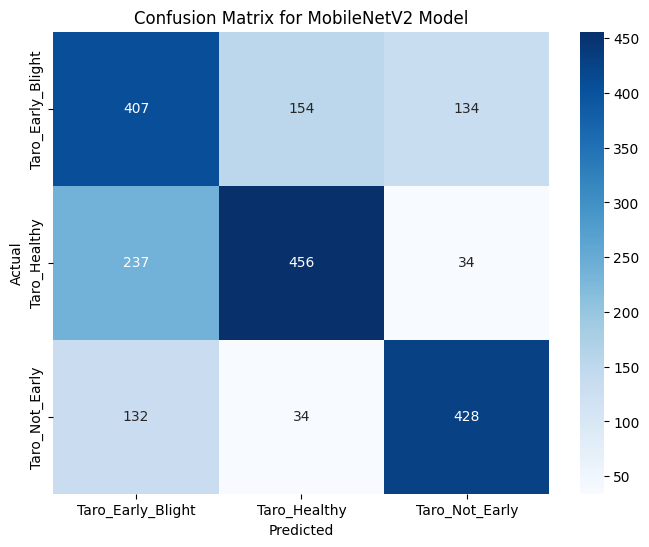

In [57]:
plot_confusion_matrix(y_true_MV2, y_pred_classes_MV2, class_names, "MobileNetV2")

## Dense 121

In [59]:
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model_dense = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(len(train_class_labels), activation='softmax')
])

29084464/29084464 [==============================] - 0s 0us/step


In [60]:
model_dense.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_dense.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 7, 7, 1024)        7037504   
                                                                 
 global_average_pooling2d_1  (None, 1024)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_16 (Dense)            (None, 512)               524800    
                                                                 
 dropout_8 (Dropout)         (None, 512)               0         
                                                                 
 dense_17 (Dense)            (None, 256)               131328    
                                                                 
 dropout_9 (Dropout)         (None, 256)               0         
                                                      

In [61]:
# Define TensorBoard callback
log_dir_dense = training_logs + "/logs/fit_dense/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback_dense = TensorBoard(log_dir=log_dir_dense, histogram_freq=1)

# Define EarlyStopping callback
early_stopping_dense = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define ModelCheckpoint callback
checkpoint_path_dense = log_dir_dense + "/model_checkpoint_dense.h5"
model_checkpoint_dense = ModelCheckpoint(filepath=checkpoint_path_dense, save_best_only=True)

# Fit the DenseNet model with early stopping, TensorBoard logging, and model checkpoint saving
history_dense = model_dense.fit(
    generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=[early_stopping_dense, tensorboard_callback_dense, model_checkpoint_dense]
)


Epoch 1/50
253/253 [==============================] - 136s 508ms/step - loss: 1.0153 - accuracy: 0.4817 - val_loss: 0.8487 - val_accuracy: 0.5833
Epoch 2/50
253/253 [==============================] - 127s 503ms/step - loss: 0.8691 - accuracy: 0.5716 - val_loss: 0.8007 - val_accuracy: 0.6076
Epoch 3/50
253/253 [==============================] - 128s 504ms/step - loss: 0.8170 - accuracy: 0.6014 - val_loss: 0.7830 - val_accuracy: 0.6106
Epoch 4/50
253/253 [==============================] - 127s 501ms/step - loss: 0.8105 - accuracy: 0.6112 - val_loss: 0.8412 - val_accuracy: 0.5744
Epoch 5/50
253/253 [==============================] - 127s 501ms/step - loss: 0.7845 - accuracy: 0.6302 - val_loss: 0.8071 - val_accuracy: 0.6022
Epoch 6/50
253/253 [==============================] - 127s 504ms/step - loss: 0.7769 - accuracy: 0.6344 - val_loss: 0.7410 - val_accuracy: 0.6806
Epoch 7/50
253/253 [==============================] - 126s 498ms/step - loss: 0.7559 - accuracy: 0.6450 - val_loss: 0.7921 -

In [62]:
save_history(history_dense, log_dir_dense + "/history_dense.npy")

In [63]:
history_dense = load_history(log_dir_dense + "/history_dense.npy")

In [64]:
y_pred_dense = model_dense.predict(validation_generator)
y_pred_classes_dense = np.argmax(y_pred_dense , axis=1)
y_true_dense = validation_generator.classes

classification_reporter(y_true_dense, y_pred_classes_dense, class_names)

63/63 [==============================] - 27s 399ms/step
                   precision    recall  f1-score   support

Taro_Early_Blight       0.58      0.58      0.58       695
     Taro_Healthy       0.71      0.71      0.71       727
   Taro_Not_Early       0.74      0.75      0.74       594

         accuracy                           0.68      2016
        macro avg       0.68      0.68      0.68      2016
     weighted avg       0.68      0.68      0.68      2016



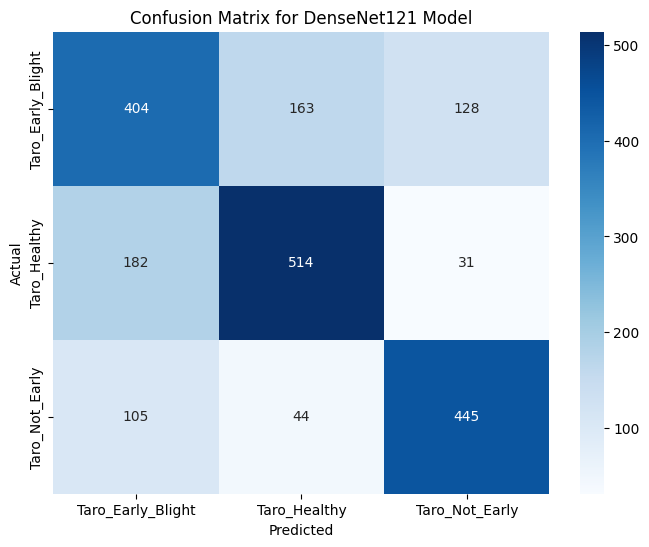

In [66]:
plot_confusion_matrix(y_true_dense, y_pred_classes_dense, class_names, "DenseNet121")

## Xception

In [67]:
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model_xception = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(len(train_class_labels), activation='softmax')
])

83683744/83683744 [==============================] - 1s 0us/step


In [68]:
model_xception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_xception.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_20 (Dense)            (None, 512)               1049088   
                                                                 
 dropout_11 (Dropout)        (None, 512)               0         
                                                                 
 dense_21 (Dense)            (None, 256)               131328    
                                                                 
 dropout_12 (Dropout)        (None, 256)               0         
                                                      

In [69]:
# Define TensorBoard callback
log_dir_xception = training_logs + "/logs/fit_xception/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback_xception = TensorBoard(log_dir=log_dir_xception, histogram_freq=1)

# Define EarlyStopping callback
early_stopping_xception = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Define ModelCheckpoint callback
checkpoint_path_xception = log_dir_xception + "/model_checkpoint_xception.h5"
model_checkpoint_xception = ModelCheckpoint(filepath=checkpoint_path_xception, save_best_only=True)

# Fit the Xception model with early stopping, TensorBoard logging, and model checkpoint saving
history_xception = model_xception.fit(
    generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=[early_stopping_xception, tensorboard_callback_xception, model_checkpoint_xception]
)

Epoch 1/50
253/253 [==============================] - 128s 489ms/step - loss: 1.0347 - accuracy: 0.4639 - val_loss: 0.9161 - val_accuracy: 0.5486
Epoch 2/50
253/253 [==============================] - 124s 492ms/step - loss: 0.9201 - accuracy: 0.5395 - val_loss: 0.8730 - val_accuracy: 0.5570
Epoch 3/50
253/253 [==============================] - 126s 500ms/step - loss: 0.8958 - accuracy: 0.5571 - val_loss: 0.8462 - val_accuracy: 0.5893
Epoch 4/50
253/253 [==============================] - 123s 486ms/step - loss: 0.8719 - accuracy: 0.5746 - val_loss: 0.8799 - val_accuracy: 0.5620
Epoch 5/50
253/253 [==============================] - 123s 488ms/step - loss: 0.8534 - accuracy: 0.5931 - val_loss: 0.9325 - val_accuracy: 0.5035
Epoch 6/50
253/253 [==============================] - 125s 495ms/step - loss: 0.8473 - accuracy: 0.5971 - val_loss: 0.8390 - val_accuracy: 0.5749
Epoch 7/50
253/253 [==============================] - 124s 491ms/step - loss: 0.8382 - accuracy: 0.5978 - val_loss: 0.8596 -

In [70]:
save_history(history_xception, log_dir_xception + "/history_xception.npy")

In [71]:
history_xception = load_history(log_dir_xception + "/history_xception.npy")

In [72]:
y_pred_xception = model_xception.predict(validation_generator)
y_pred_classes_xception = np.argmax(y_pred_xception , axis=1)
y_true_xception = validation_generator.classes

classification_reporter(y_true_xception, y_pred_classes_xception, class_names)

63/63 [==============================] - 25s 387ms/step
                   precision    recall  f1-score   support

Taro_Early_Blight       0.45      0.28      0.35       695
     Taro_Healthy       0.65      0.74      0.69       727
   Taro_Not_Early       0.57      0.71      0.63       594

         accuracy                           0.57      2016
        macro avg       0.55      0.58      0.56      2016
     weighted avg       0.56      0.57      0.56      2016



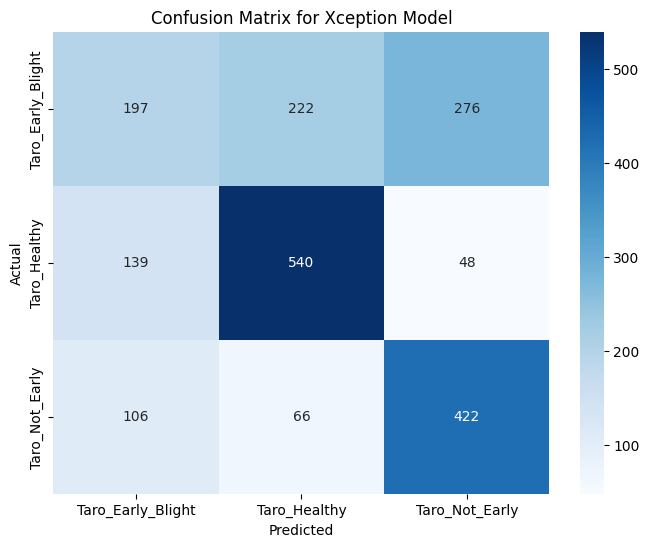

In [73]:
plot_confusion_matrix(y_true_xception, y_pred_classes_xception, class_names, "Xception")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Classification_training_results/logs/fit_resnet/20240412-121246/train', '/content/drive/MyDrive/Classification_training_results/logs/fit_vgg16/20240412-113845/train'

In [ ]:
!ls "/content/drive/MyDrive/Classification_training_results/logs/fit_resnet/20240412-121246/train"

events.out.tfevents.1712923967.80cb1f1ac1db.615.4.v2


In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Classification_training_results/logs'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

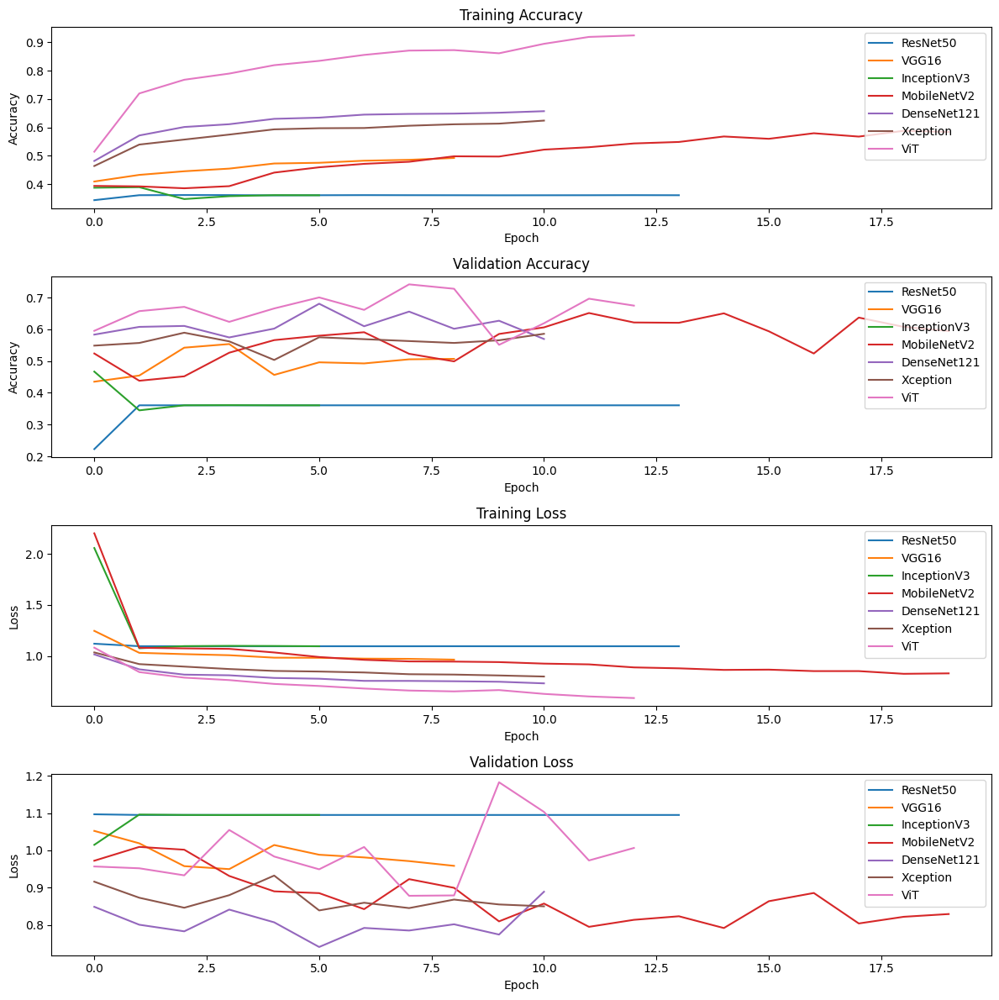

In [76]:
titles = ['ResNet50', 'VGG16', "InceptionV3", "MobileNetV2", "DenseNet121", "Xception", "ViT"]

combined_plot_history([history_resnet, history_vgg16, history_iv3, history_mv2, history_dense, history_xception, history_vit], titles)
